
## Snippet 1


### Load in the data set from disk.


In [1]:
using DataFrames
df = readtable("data/01_heights_weights_genders.csv")

,Gender,Height,Weight
1,Male,73.847017017515,241.893563180437
2,Male,68.7819040458903,162.3104725213
3,Male,74.1101053917849,212.7408555565
4,Male,71.7309784033377,220.042470303077
5,Male,69.8817958611153,206.349800623871
6,Male,67.2530156878065,152.212155757083
7,Male,68.7850812516616,183.927888604031
8,Male,68.3485155115879,167.971110489509
9,Male,67.018949662883,175.92944039571
10,Male,63.4564939783664,156.399676387112


### Create a numeric DataArray containing just the heights data.

In [2]:
heights = df[:Height]

10000-element DataArrays.DataArray{Float64,1}:
 73.847 
 68.7819
 74.1101
 71.731 
 69.8818
 67.253 
 68.7851
 68.3485
 67.0189
 63.4565
 71.1954
 71.6408
 64.7663
  ⋮     
 59.5387
 60.9551
 63.1795
 62.6367
 62.0778
 60.0304
 59.0983
 66.1727
 67.0672
 63.868 
 69.0342
 61.9442

In [3]:
median(heights)

66.31807008178464

In [4]:
mean(heights)

66.36755975482124

## Snippet 2

### Define our own mean and median functions.

In [5]:
function mymean(x) 
    return (sum(x) / length(x))
end


mymean (generic function with 1 method)

In [6]:
function mymedian(x)
    sorted = sort(x)
    if length(x) % 2 == 0
        indices = Array{Int64}(2) 
        indices = [Int64(length(x)/2), Int64(length(x)/2 + 1)]
        return (sorted[indices[1]] + sorted[indices[2]]) / 2
    else 
        index = ceil(length(x)/2)
        return mean(sorted[index])
    end
end

mymedian (generic function with 1 method)

## Snippet 3

### Compare means and medians on toy examples.

In [7]:
array = [0,100]

2-element Array{Int64,1}:
   0
 100

In [8]:
mean(array)

50.0

In [9]:
median(array)

50.0

In [10]:
array = [0, 0, 100]

3-element Array{Int64,1}:
   0
   0
 100

In [11]:
mean(array)

33.333333333333336

In [12]:
median(array)

0.0

## Snippet 4


### Confirm that our mean and median functions produce the correct answer.

In [13]:
mymean(heights)

66.36755975482124

In [14]:
mymedian(heights)

66.31807008178464

In [15]:
mean(heights) - mymean(heights)

0.0

In [16]:
median(heights) - mymedian(heights)

0.0

## Snippet 5

### Experiment with functions for assessing the range of a data set.

In [17]:
minimum(heights)

54.2631333250971

## Snippet 6

In [18]:
maximum(heights)

78.9987423463896

## Snippet 7 

In [19]:
extrema(heights)

(54.2631333250971,78.9987423463896)

## Snippet 8

In [20]:
quantile(heights, [0, 0.25, 0.5, 0.75, 1])

5-element Array{Float64,1}:
 54.2631
 63.5056
 66.3181
 69.1743
 78.9987

## Snippet 9

In [21]:
quantile(heights, collect(0:0.2:1))

6-element Array{Float64,1}:
 54.2631
 62.859 
 65.1942
 67.4354
 69.8116
 78.9987

## Snippet 10

In [22]:
collect(0:0.2:1)

6-element Array{Float64,1}:
 0.0
 0.2
 0.4
 0.6
 0.8
 1.0

## Snippet 11


### Define a variance function to assess the spread of data.

In [23]:
function myvar(x)
    m = mean(x)
    return sum(map(val -> (val - m) ^ 2, x)) / length(x)
end

myvar (generic function with 1 method)

## Snippet 12
### Test our variance function for correctness.

In [24]:
myvar(heights)

14.801992292876758

In [25]:
var(heights)

14.803472640140773

## Snippet 13

### Update the variance function to make it unbiased.

In [26]:
function myunbiasedvar(x)
    m = mean(x)
    return sum(map(val -> (val - m) ^ 2, x)) / (length(x) - 1)
end

myunbiasedvar (generic function with 1 method)

### Test our variance function again for correctness.

In [27]:
myunbiasedvar(heights)

14.803472640140772

In [28]:
var(heights)

14.803472640140773

## Snippet 14
### Check the range predicted by the variance function.

In [29]:
mean(heights) - var(heights), mean(heights) + var(heights)

(51.56408711468047,81.17103239496201)

## Snippet 15

In [30]:
mean(heights) - var(heights), mean(heights) + var(heights)

(51.56408711468047,81.17103239496201)

In [31]:
extrema(heights)

(54.2631333250971,78.9987423463896)

## Snippet 16

### Switch to standard deviations instead for thinking about ranges.

In [32]:
function mystd(x)
    return sqrt(myunbiasedvar(x))
end

mystd (generic function with 1 method)

## Snippet 17

### Test our standard deviation function for correctness.

In [33]:
mystd(heights)

3.8475281207732284

In [34]:
std(heights)

3.847528120773229

## Snippet 18


In [35]:
mean(heights) - std(heights), mean(heights) + std(heights)

(62.52003163404802,70.21508787559448)

In [36]:
extrema(heights)

(54.2631333250971,78.9987423463896)

## Snippet 19

In [37]:

mean(heights) - std(heights), mean(heights) + std(heights)


(62.52003163404802,70.21508787559448)

In [38]:
quantile(heights, 0.25), quantile(heights, 0.75)

(63.505620481218955,69.1742617268347)

## Snippet 20


### Start visualizing data using the ggplot2 package.

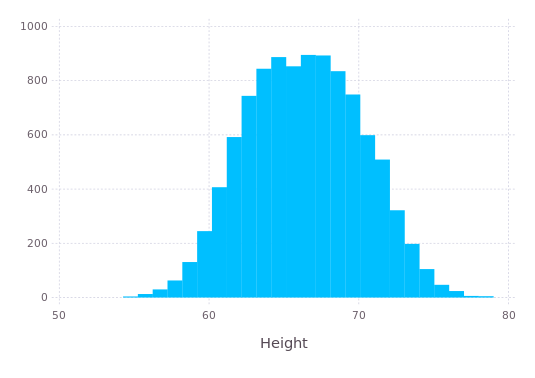

In [39]:
using Gadfly
plot(df, x="Height", Geom.histogram(bincount=25))

## Snippet 21

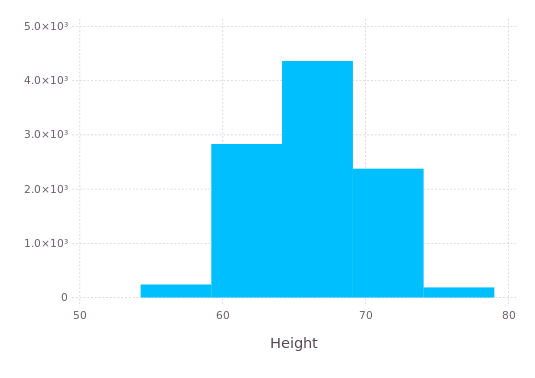

In [40]:
plot(df, x="Height", Geom.histogram(bincount=5))

## Snippet 22

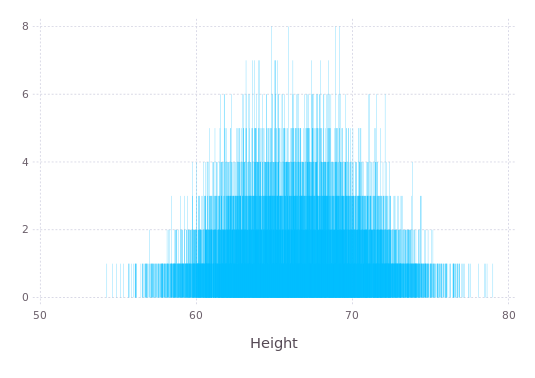

In [41]:
plot(df, x="Height", Geom.histogram(bincount=10000))

## Snippet 23

### Experiment with kernel density estimates.

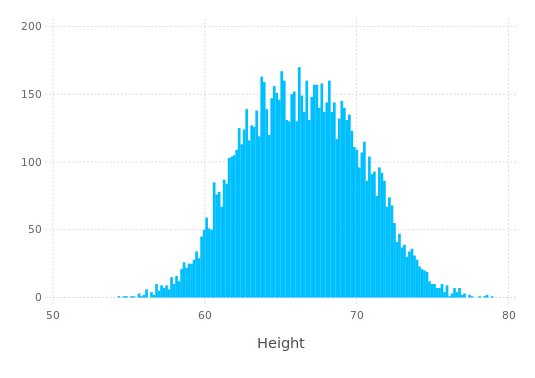

In [42]:
plot(df, x="Height", Geom.histogram)

## Snippet 24

### Separate out heights and weights based on gender.


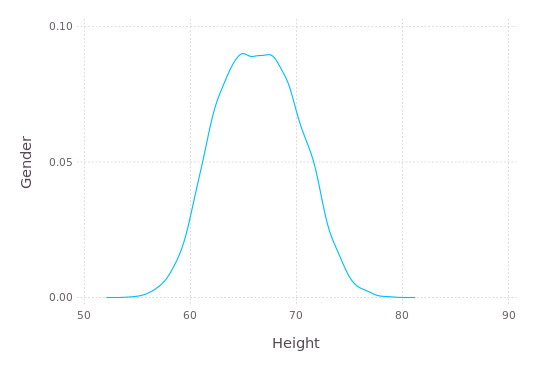

In [43]:
plot(df, x="Height", y="Gender", Geom.density)

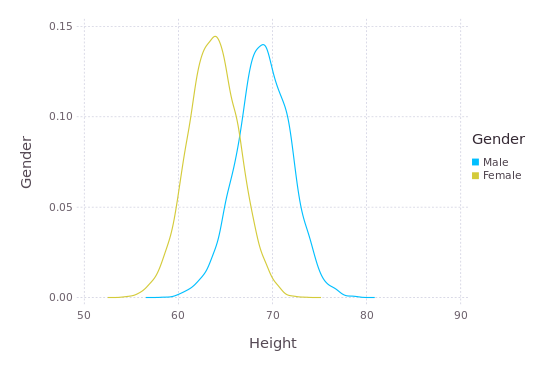

In [44]:
plot(df, x="Height", y="Gender", color="Gender", Geom.density)

## Snippet 25

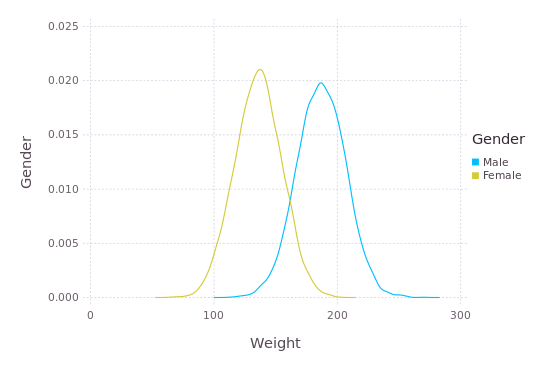

In [45]:
plot(df, x="Weight", y="Gender", color="Gender", Geom.density)

## Snippet 26

### Produce two facets in a single plot to make it easier to see the hidden structure.

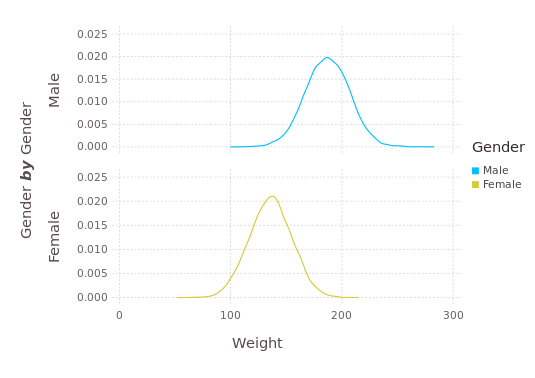

In [46]:
plot(df, ygroup="Gender" ,x="Weight", y="Gender", color="Gender", Geom.subplot_grid(Geom.density))



## Snippet 27

### Experiment with random numbers from the normal distribution.

In [47]:
using Distributions

plot(DataFrame(X = rand(Normal(0, 1), 10000) + rand_normal(0, 1)), x="X", Geom.density)



LoadError: LoadError: UndefVarError: rand_normal not defined
while loading In[47], in expression starting on line 3

## Snippet 28

### Compare the normal distribution with the Cauchy distribution.

In [48]:
srand(1)
normal_values = rand(Normal(0, 1), 250)
cauchy_values = rand(Cauchy(0, 1), 250)
extrema(normal_values)

(-2.748600587280482,2.2950878238373105)

In [49]:
extrema(cauchy_values)

(-148.8706482930875,81.40805157069148)

## Snippet 29

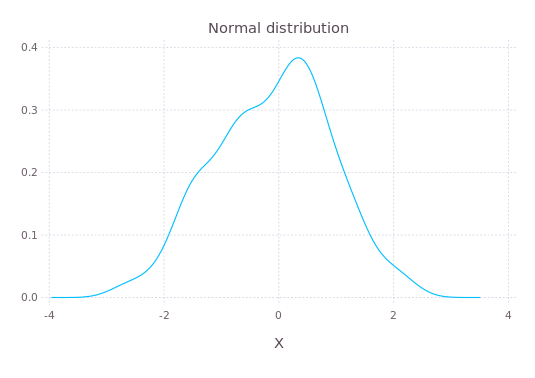

In [50]:
plot(DataFrame(X = normal_values), x="X", Geom.density, Guide.title("Normal distribution"))


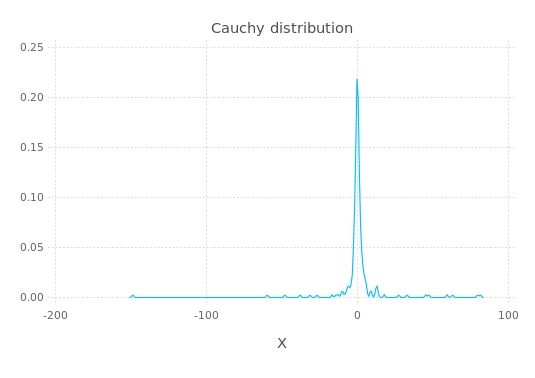

In [51]:
plot(DataFrame(X = cauchy_values), x="X", Geom.density, Guide.title("Cauchy distribution"))


## Snippet 30


### Experiment with random numbers from the gamma distribution.

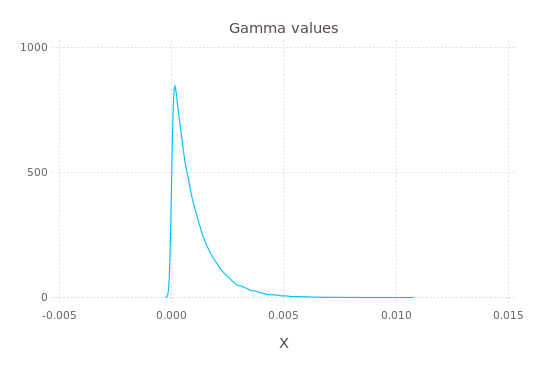

In [52]:
gamma_values = rand(Gamma(1, 0.001), 100000)
plot(DataFrame(X = gamma_values), x="X", Geom.density, Guide.title("Gamma values"))


## Snippet 31

### Generate scatterplots of the heights and weights to see their relationship.

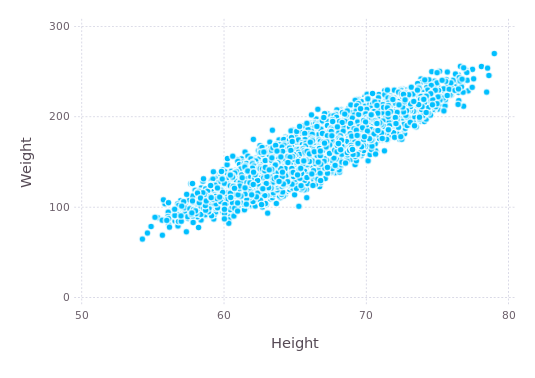

In [53]:
plot(df, x="Height", y="Weight", Geom.point)

## Snippet 32

### Add a smooth shape that relates the two explicitly.

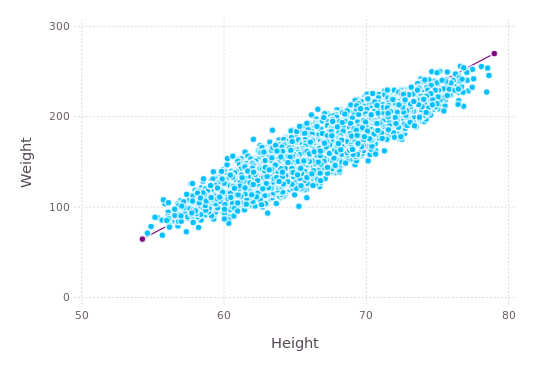

In [54]:
xmin, xmax = extrema(df[:Height])
ymin, ymax = extrema(df[:Weight])
plot(layer(df, x="Height", y="Weight", Geom.point, order = 1),
layer(x=[xmin, xmax],y=[ymin, ymax], Geom.point,Geom.line, Theme(default_color=colorant"purple"), order = 10))


## Snippet 33

### See how the smooth shape gets better with more data.

- 20 points

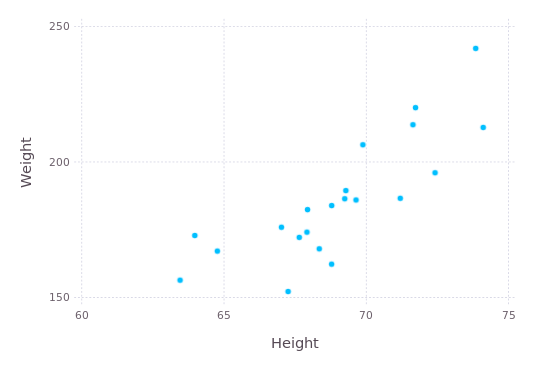

In [55]:
plot(df[1:21,:], x="Height", y="Weight", Geom.point)

- 200 points

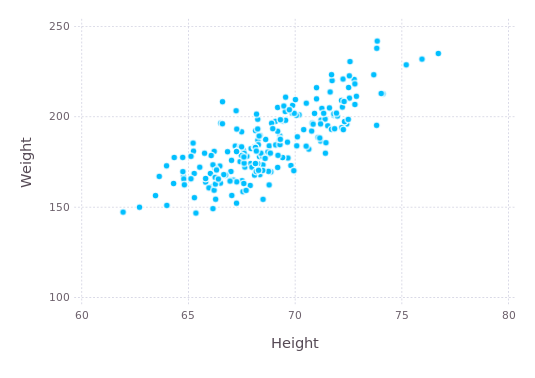

In [56]:
plot(df[1:201,:], x="Height", y="Weight", Geom.point)

- 2000 points

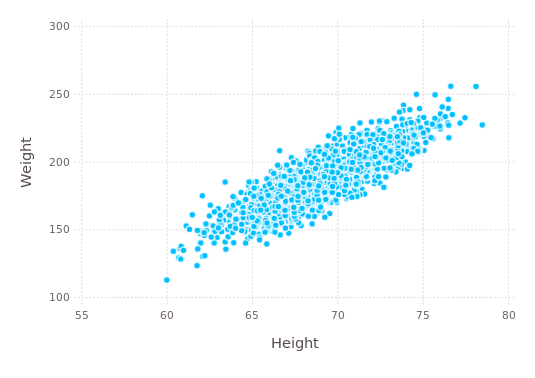

In [57]:
plot(df[1:2001,:], x="Height", y="Weight", Geom.point)

## Snippet 34

### Visualize how gender depends on height and weight.

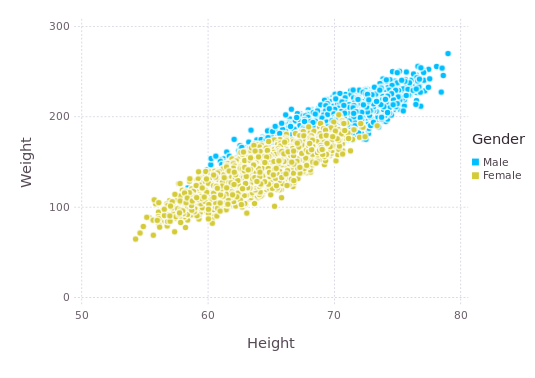

In [58]:
plot(df, x="Height", y="Weight", Geom.point, color="Gender")

### Snippet 35

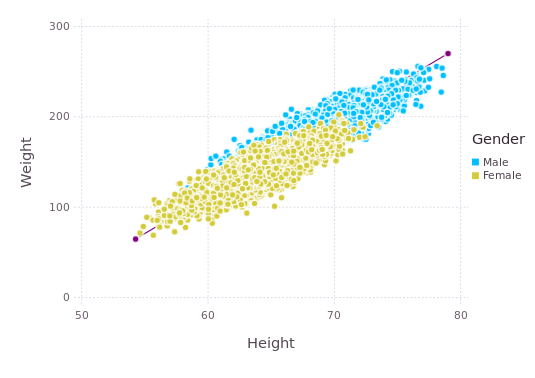

In [59]:
xmin, xmax = extrema(df[:Height])
ymin, ymax = extrema(df[:Weight])
plot(layer(df, x="Height", y="Weight", Geom.point, color="Gender", order = 1),
layer(x=[xmin, xmax],y=[ymin, ymax], Geom.point,Geom.line, Theme(default_color=colorant"purple"), order = 10))
